This program will hopefully overlay the centroids from the segmentation json file and overlay them with the tile that I cropped in 20x

In [174]:
from tifffile import imread
import os
from matplotlib import pyplot as plt
import json
from scipy.io import loadmat
import h5py

In [497]:
pth_tiles = r'\\10.99.68.178\andreex\students\Donald Monkey fetus\BTC\20x_Cropped'
pth_WSI_segmentations = r'\\10.99.68.178\andreex\students\Donald Monkey fetus\BTC\ndpi\StarDist_1_12_24\json'
pth_crop_tile_mat_folder = r'\\10.99.68.178\andreex\students\Donald Monkey fetus\BTC\matfiles'

In [176]:
tile_pth_list = [os.path.join(pth_tiles,file) for file in os.listdir(pth_tiles) if file.endswith(".tif")]
json_pth_list = [os.path.join(pth_WSI_segmentations,file) for file in os.listdir(pth_WSI_segmentations) if file.endswith(".json")]
crop_mat_list = [os.path.join(pth_crop_tile_mat_folder,file) for file in os.listdir(pth_crop_tile_mat_folder) if file.endswith(".mat")]  # tile cropping info in mat files folder

In [177]:
print(tile_pth_list)

['\\\\10.99.68.178\\andreex\\students\\Donald Monkey fetus\\BTC\\20x_Cropped\\H15_0277.tif']


In [178]:
print(json_pth_list)

['\\\\10.99.68.178\\andreex\\students\\Donald Monkey fetus\\BTC\\ndpi\\StarDist_1_12_24\\json\\H15_0277.json']


In [179]:
sample_names = [f.split('\\')[-1][:-4] for f in tile_pth_list]
sample_names

['H15_0277']

In [180]:
WSIs_in_tile_list = [os.path.join(pth_WSI_segmentations, f.split('\\')[-1]) for f in json_pth_list if f.split('\\')[-1][:-5] in sample_names]
WSIs_in_tile_list

['\\\\10.99.68.178\\andreex\\students\\Donald Monkey fetus\\BTC\\ndpi\\StarDist_1_12_24\\json\\H15_0277.json']

In [181]:
WSIs_in_tile_list = sorted(WSIs_in_tile_list)
tile_pth_list = sorted(tile_pth_list)
crop_mat_list = sorted(crop_mat_list)

In [182]:
def get_crop_info(mat_file_name) -> tuple:

    try:
        data = loadmat(mat_file_name)

        crop_x = int(data['crop_x_20x'])
        crop_y = int(data['crop_y_20x'])
        
        width = int(data['crop_width_20x'])
        height = width
    except:
        print(mat_file_name)
        data = h5py.File(mat_file_name, 'r')

        crop_x = int(data['crop_x_20x'][()])
        crop_y = int(data['crop_y_20x'][()])
        
        width = int(data['crop_y_20x'][()])
        height = width

    return crop_x, crop_y, width, height

In [183]:
ind = 0

HE_20x_tile = imread(tile_pth_list[ind])
crop_data = get_crop_info(crop_mat_list[ind])
segmentation_data = json.load(open(json_pth_list[ind]))

In [388]:
contours = [nuc['contour'] for nuc in segmentation_data]
print(len(contours))

355861


In [184]:
def show_tile(tile, **kwargs):
    """Plot a single image."""
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    ax.imshow(tile, **kwargs)
    plt.tight_layout()
    ax.set_axis_off()
    plt.show()

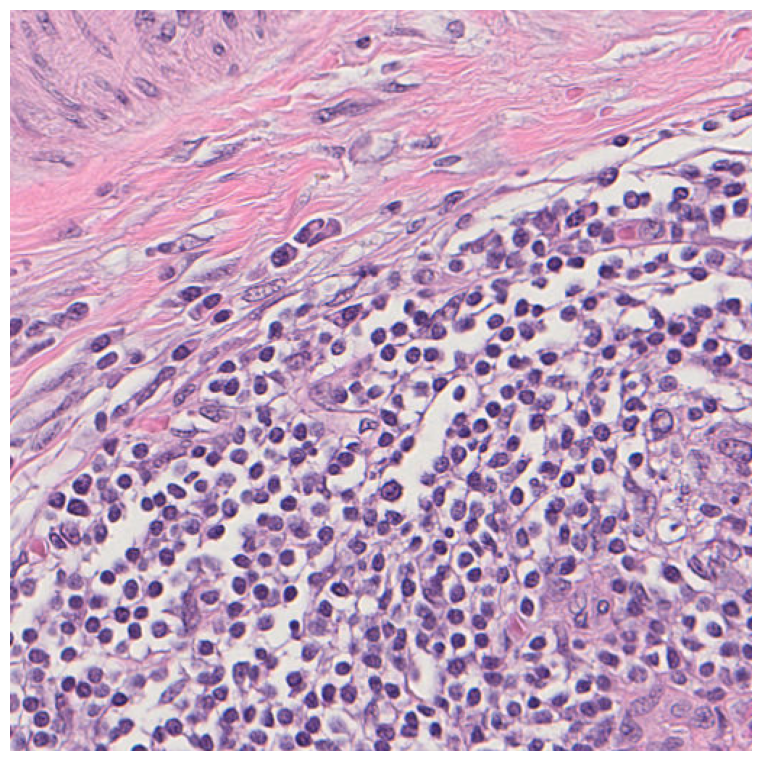

In [185]:
show_tile(HE_20x_tile)

In [186]:
crop_data

(34049, 34143, 512, 512)

In [187]:
segmentation_data[0].keys()

dict_keys(['centroid', 'contour'])

In [188]:
centroids = [nuc['centroid'] for nuc in segmentation_data]
print(len(centroids))

355861


In [189]:
adj_centroids = [[pair[0][0] - crop_data[0], pair[0][1] - crop_data[1]] for pair in centroids]

In [190]:
adj_centroids[:5]

[[-30771, -32337],
 [-32865, -30477],
 [-32589, -28041],
 [-30885, -28521],
 [-31289, -28437]]

In [191]:
centroids_in_tile = [pair for pair in adj_centroids if 0 < pair[0] < crop_data[2] and 0 < pair[1] < crop_data[3]]

In [192]:
len(centroids_in_tile)

651

In [193]:
centroids_in_tile[:5]

[[423, 37], [341, 231], [321, 123], [341, 55], [359, 215]]

In [194]:
def show_tile(tile, centroids=None, **kwargs):
    """Plot a single image with optional centroids overlay."""
    fig, ax = plt.subplots(1,2, figsize=(16, 8))
    
    ax[0].imshow(tile)
    
    # Show the image
    ax[1].imshow(tile, **kwargs)
    
    # Overlay centroids if provided
    if centroids:
        centroids = list(map(list, zip(*centroids)))  # Transpose the centroids list
        ax[1].scatter(centroids[1], centroids[0], marker='o', color='red', s=50, label='Centroids')
    
    plt.tight_layout()
    ax[0].set_axis_off()
    
    # Show the legend if centroids are present
    if centroids:
        ax[1].legend()
    
    ax[1].set_axis_off()
    
    plt.show()

In [195]:
# centroids_in_tile_2 = [[pair[0] - 10, pair[1] -20] for pair in centroids_in_tile]

In [196]:
crop_data

(34049, 34143, 512, 512)

In [197]:
adj_centroids = [[pair[0][0] - crop_data[1], pair[0][1] - crop_data[0]] for pair in centroids]
# rev_centroids = [pair[::-1] for pair in adj_centroids]
centroids_in_tile_2 = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]


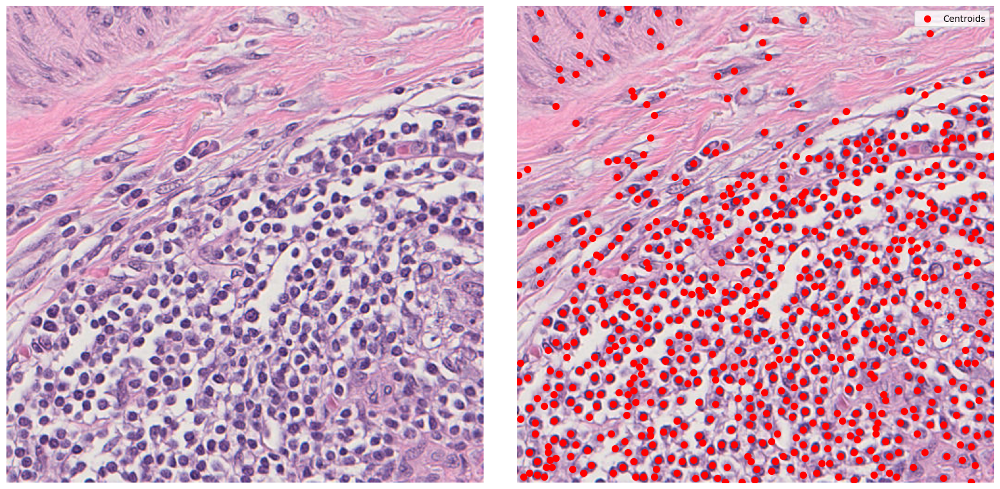

In [198]:
show_tile(HE_20x_tile, centroids=centroids_in_tile_2)

In [199]:
geojson_file = r'\\10.99.68.178\andreex\students\Donald Monkey fetus\BTC\qupath\geojson\H15_0277.geojson'

In [200]:
import geojson

In [201]:
geo_data = json.load(open(geojson_file))

In [202]:
geo_data.keys()

dict_keys(['type', 'features'])

In [203]:
len(geo_data['features'])

50

In [204]:
centroids_ann = []

for i in range(len(geo_data['features'])):
    data = geo_data['features'][i]
    coords = data['geometry']['coordinates'][0]
    
    x_cent = 0
    y_cent = 0
    for pair in coords:
        x_cent += pair[1]
        y_cent += pair[0]
    x_cent /= len(coords)
    y_cent /= len(coords)
    
    # print(x_cent, y_cent)
    centroids_ann.append([x_cent, y_cent])

In [383]:
print(len(contours))
print(len(contours[0]))

50
19


In [205]:
centroids_ann

[[34546.0, 34242.73684210526],
 [34545.333333333336, 34222.2],
 [34540.10526315789, 34207.73684210526],
 [34524.23809523809, 34209.666666666664],
 [34523.61538461538, 34225.230769230766],
 [34534.36363636364, 34216.59090909091],
 [34504.63157894737, 34191.57894736842],
 [34543.933333333334, 34278.666666666664],
 [34536.26315789474, 34262.47368421053],
 [34556.35, 34267.6],
 [34569.10526315789, 34244.57894736842],
 [34565.70609756098, 34225.277804878046],
 [34557.21428571428, 34206.07142857143],
 [34549.810731707315, 34188.975853658536],
 [34571.2, 34207.0],
 [34584.318181818184, 34185.59090909091],
 [34587.21052631579, 34222.47368421053],
 [34601.47368421053, 34216.63157894737],
 [34601.933333333334, 34206.46666666667],
 [34604.666666666664, 34245.666666666664],
 [34587.318181818184, 34255.59090909091],
 [34598.4375, 34278.0625],
 [34592.2, 34299.26666666667],
 [34574.0, 34299.77777777778],
 [34524.23529411765, 34303.41176470588],
 [34513.23809523809, 34288.52380952381],
 [34505.807352

In [207]:
adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroids_ann]
# rev_centroids = [pair[::-1] for pair in adj_centroids]
centroids_in_tile_ann = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]

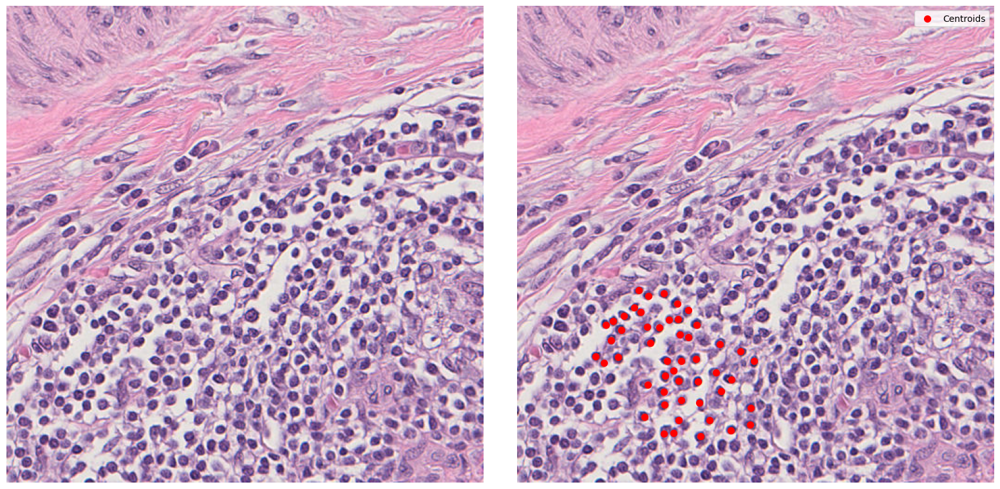

In [208]:
show_tile(HE_20x_tile, centroids=centroids_in_tile_ann)

In [212]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

In [233]:
centroids2 = [centroid[0] for centroid in centroids]
centroids2

[[3278, 1806],
 [1184, 3666],
 [1460, 6102],
 [3164, 5622],
 [2760, 5706],
 [722, 5396],
 [2836, 8810],
 [1798, 8740],
 [1640, 10066],
 [3402, 10922],
 [3916, 12694],
 [3946, 12386],
 [3956, 12394],
 [3934, 12526],
 [3952, 12330],
 [3900, 12686],
 [3958, 12482],
 [3942, 12512],
 [3934, 12440],
 [3956, 12580],
 [3944, 12524],
 [3910, 12700],
 [3948, 12348],
 [3942, 12500],
 [736, 15610],
 [800, 17248],
 [2650, 22886],
 [1886, 23010],
 [3616, 30314],
 [1592, 31160],
 [460, 30962],
 [3876, 30418],
 [2114, 29084],
 [502, 34000],
 [2336, 36128],
 [2460, 35756],
 [1926, 35564],
 [3530, 43098],
 [4878, 2414],
 [4580, 1712],
 [6444, 6870],
 [5404, 5742],
 [6450, 6936],
 [7170, 5610],
 [6610, 10546],
 [7184, 10320],
 [6632, 10292],
 [6492, 10562],
 [6412, 10706],
 [6470, 10582],
 [6934, 10756],
 [7048, 10402],
 [6524, 10396],
 [6856, 10854],
 [6586, 10822],
 [6366, 10818],
 [7584, 10756],
 [7244, 10740],
 [7564, 10556],
 [7348, 10284],
 [7108, 10646],
 [6286, 10700],
 [6174, 10668],
 [7098, 104

In [234]:
print(f'Number of  annotated: {len(centroids_in_tile_ann)}')
print(f'Number of centroids total: {len(centroids2)}')

Number of  annotated: 50
Number of centroids total: 355861


In [235]:
centroids_ann_np = np.array(centroids_ann)
centroids_total_np = np.array(centroids2)

In [236]:
centroids_total_np

array([[ 3278,  1806],
       [ 1184,  3666],
       [ 1460,  6102],
       ...,
       [40096, 42716],
       [38118, 45870],
       [38588, 43724]])

In [247]:
# https://stackoverflow.com/questions/71027729/finding-optimal-nearest-neighbour-pairs

import numpy as np
from sklearn.neighbors import NearestNeighbors
from scipy.sparse import csr_matrix, csgraph

def colocalize_points(points_a: np.ndarray, points_b: np.ndarray, r: int):
    """ Find pairs that minimize global distance. Filters out anything outside radius `r` """

    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(points_b)
    distances, b_indices = neigh.radius_neighbors(points_a, radius=r)

    # flatten and get indices for A. This will also drop points in A with no matches in range
    d_flat = np.hstack(distances) + 1
    b_flat = np.hstack(b_indices)
    a_flat = np.array([i for i, neighbors in enumerate(distances) for n in neighbors])

    # filter out A points that cannot be matched
    sm = csr_matrix((d_flat, (a_flat, b_flat)))
    a_matchable = csgraph.maximum_bipartite_matching(sm, perm_type='column')
    sm_filtered = sm[a_matchable != -1]

    # now run the distance minimizing matching
    row_match, col_match = csgraph.min_weight_full_bipartite_matching(sm_filtered)
    return row_match, col_match

In [248]:
results = colocalize_points(centroids_ann_np, centroids_total_np, r=20)

In [251]:
results

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 array([342930, 344720, 342962, 343610, 342844, 344232, 344657, 348158,
        347462, 343236, 345913, 342998, 343937, 345428, 345224, 344980,
        348380, 344430, 351379, 346027, 345241, 342841, 346165, 344798,
        345007, 348607, 345829, 343342, 344981, 343646, 344760, 345024,
        343432, 346074, 345551, 342792, 349540, 343926, 343837, 343555,
        344895, 343124, 346758, 344052, 345808, 343874, 344192, 344662,
        343081, 342932]))

In [259]:
centroids_annotated = [centroids_ann_np[i] for i in results[0]]
centroids_annotated

[array([34546.        , 34242.73684211]),
 array([34545.33333333, 34222.2       ]),
 array([34540.10526316, 34207.73684211]),
 array([34524.23809524, 34209.66666667]),
 array([34523.61538462, 34225.23076923]),
 array([34534.36363636, 34216.59090909]),
 array([34504.63157895, 34191.57894737]),
 array([34543.93333333, 34278.66666667]),
 array([34536.26315789, 34262.47368421]),
 array([34556.35, 34267.6 ]),
 array([34569.10526316, 34244.57894737]),
 array([34565.70609756, 34225.27780488]),
 array([34557.21428571, 34206.07142857]),
 array([34549.81073171, 34188.97585366]),
 array([34571.2, 34207. ]),
 array([34584.31818182, 34185.59090909]),
 array([34587.21052632, 34222.47368421]),
 array([34601.47368421, 34216.63157895]),
 array([34601.93333333, 34206.46666667]),
 array([34604.66666667, 34245.66666667]),
 array([34587.31818182, 34255.59090909]),
 array([34598.4375, 34278.0625]),
 array([34592.2       , 34299.26666667]),
 array([34574.        , 34299.77777778]),
 array([34524.23529412, 34

In [260]:
centroids_all = [centroids_total_np[i] for i in results[1]]
centroids_all

[array([34546, 34242]),
 array([34544, 34222]),
 array([34540, 34206]),
 array([34524, 34208]),
 array([34522, 34224]),
 array([34534, 34216]),
 array([34504, 34190]),
 array([34544, 34276]),
 array([34536, 34260]),
 array([34556, 34266]),
 array([34568, 34244]),
 array([34566, 34224]),
 array([34556, 34204]),
 array([34548, 34186]),
 array([34570, 34206]),
 array([34584, 34184]),
 array([34588, 34220]),
 array([34602, 34216]),
 array([34600, 34206]),
 array([34604, 34244]),
 array([34586, 34256]),
 array([34598, 34278]),
 array([34592, 34298]),
 array([34574, 34298]),
 array([34524, 34302]),
 array([34512, 34286]),
 array([34504, 34266]),
 array([34498, 34232]),
 array([34496, 34222]),
 array([34484, 34240]),
 array([34470, 34230]),
 array([34480, 34222]),
 array([34480, 34212]),
 array([34486, 34200]),
 array([34488, 34188]),
 array([34472, 34180]),
 array([34466, 34172]),
 array([34476, 34164]),
 array([34480, 34152]),
 array([34484, 34142]),
 array([34500, 34150]),
 array([34490, 3

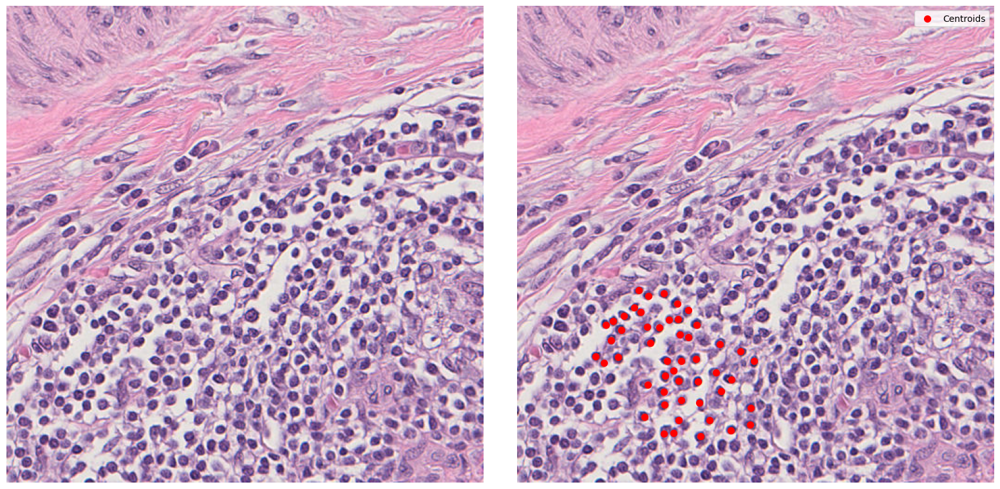

In [263]:
adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroids_annotated]
# rev_centroids = [pair[::-1] for pair in adj_centroids]
centroids_in_tile_ann = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]
show_tile(HE_20x_tile, centroids=centroids_in_tile_ann)

In [291]:
import matplotlib.pyplot as plt

def show_tile_3(tile, centroids1, centroids2):
    """Plot a single image with optional centroids overlay."""
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    # Show the image with centroids overlay if provided
    centroids1 = list(map(list, zip(*centroids1)))  # Transpose the centroids list
    ax[0].imshow(tile)
    ax[0].scatter(centroids1[1], centroids1[0], marker='o', color='red', s=50, label='Qupath annotated')
    ax[0].legend()

    ax[0].set_axis_off()
    
    centroids2 = list(map(list, zip(*centroids2)))  # Transpose the centroids list
    ax[1].imshow(tile)
    ax[1].scatter(centroids2[1], centroids2[0], marker='o', color='yellow', s=50, label='Segmented')
    ax[1].legend()
    ax[1].set_axis_off()

    plt.tight_layout()
    plt.show()

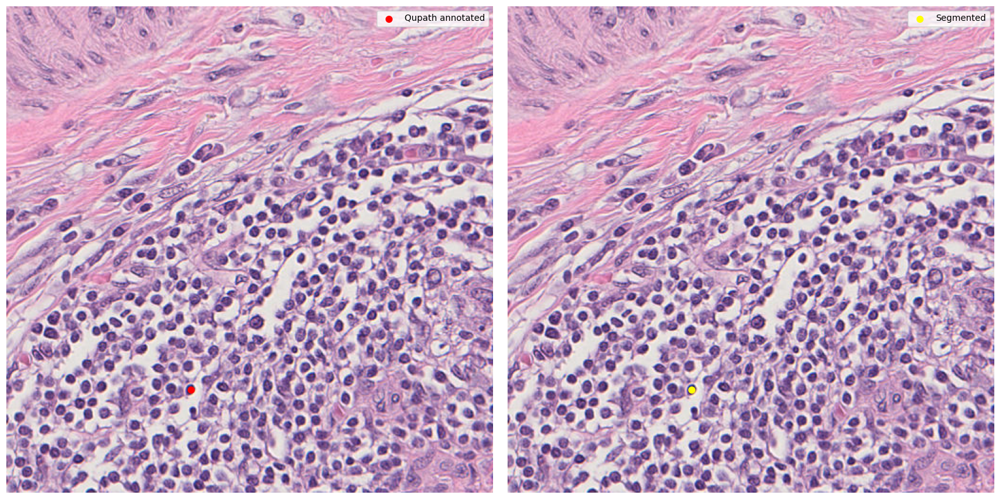

In [314]:
i = 0
for i in range(len(centroids_in_tile_ann)):
    centroid_ann = [centroids_annotated[i]]
    centroid_segmented = [centroids_all[i]]
    
    adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroid_ann]
    centroids_in_tile_ann1 = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]
    
    adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroid_segmented]
    centroids_in_tile_ann2 = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]
    
    show_tile_3(HE_20x_tile, centroids1=centroids_in_tile_ann1, centroids2=centroids_in_tile_ann2)
    break

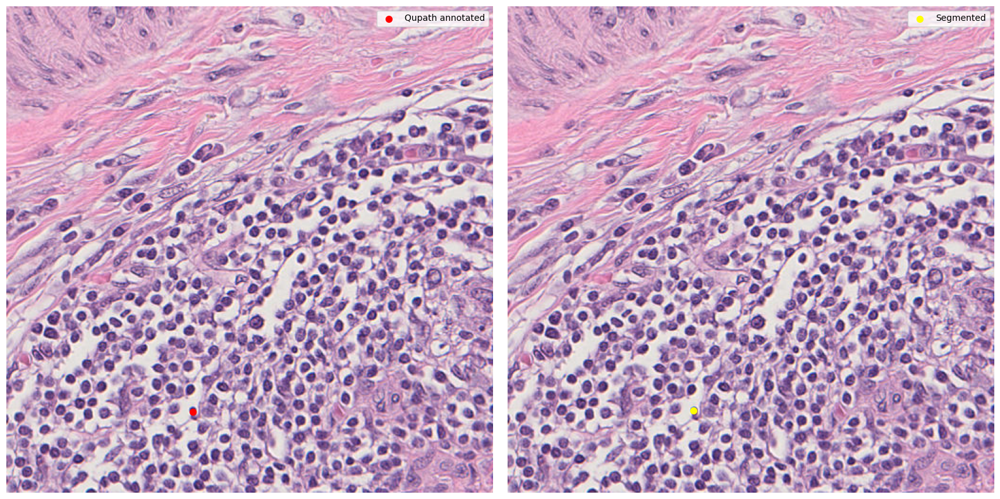

In [324]:
i += 1

centroid_ann = [centroids_annotated[i]]
centroid_segmented = [centroids_all[i]]

adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroid_ann]
centroids_in_tile_ann1 = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]

adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroid_segmented]
centroids_in_tile_ann2 = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]

show_tile_3(HE_20x_tile, centroids1=centroids_in_tile_ann1, centroids2=centroids_in_tile_ann2)

In [326]:
centroids_all

[array([34546, 34242]),
 array([34544, 34222]),
 array([34540, 34206]),
 array([34524, 34208]),
 array([34522, 34224]),
 array([34534, 34216]),
 array([34504, 34190]),
 array([34544, 34276]),
 array([34536, 34260]),
 array([34556, 34266]),
 array([34568, 34244]),
 array([34566, 34224]),
 array([34556, 34204]),
 array([34548, 34186]),
 array([34570, 34206]),
 array([34584, 34184]),
 array([34588, 34220]),
 array([34602, 34216]),
 array([34600, 34206]),
 array([34604, 34244]),
 array([34586, 34256]),
 array([34598, 34278]),
 array([34592, 34298]),
 array([34574, 34298]),
 array([34524, 34302]),
 array([34512, 34286]),
 array([34504, 34266]),
 array([34498, 34232]),
 array([34496, 34222]),
 array([34484, 34240]),
 array([34470, 34230]),
 array([34480, 34222]),
 array([34480, 34212]),
 array([34486, 34200]),
 array([34488, 34188]),
 array([34472, 34180]),
 array([34466, 34172]),
 array([34476, 34164]),
 array([34480, 34152]),
 array([34484, 34142]),
 array([34500, 34150]),
 array([34490, 3

In [370]:
import matplotlib.pyplot as plt

def show_tile_4(tile, centroids1, centroids2):
    """Plot a single image with optional centroids overlay."""
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    # Show the image with centroids overlay if provided
    centroids1 = list(map(list, zip(*centroids1)))  # Transpose the centroids list
    ax[0].imshow(tile)
    ax[0].scatter(centroids1[1], centroids1[0], marker='o', color='red', s=50, label='Qupath annotated')
    ax[0].legend()

    ax[0].set_axis_off()
    
    centroids2 = list(map(list, zip(*centroids2)))  # Transpose the centroids list
    ax[1].imshow(tile)
    ax[1].scatter(centroids2[1], centroids2[0], marker='o', color='yellow', s=50, label='Segmented')
    ax[1].scatter(centroids1[1], centroids1[0], marker='o', color='green', s=50, label='Qupath annotated')
    ax[1].legend()
    ax[1].set_axis_off()

    plt.tight_layout()
    plt.show()

In [359]:
len(centroids_all)

50

In [364]:
centroids_matched = [pair.tolist() for pair in centroids_all]
centroids_matched

adj_centroids_matched = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroids_matched]

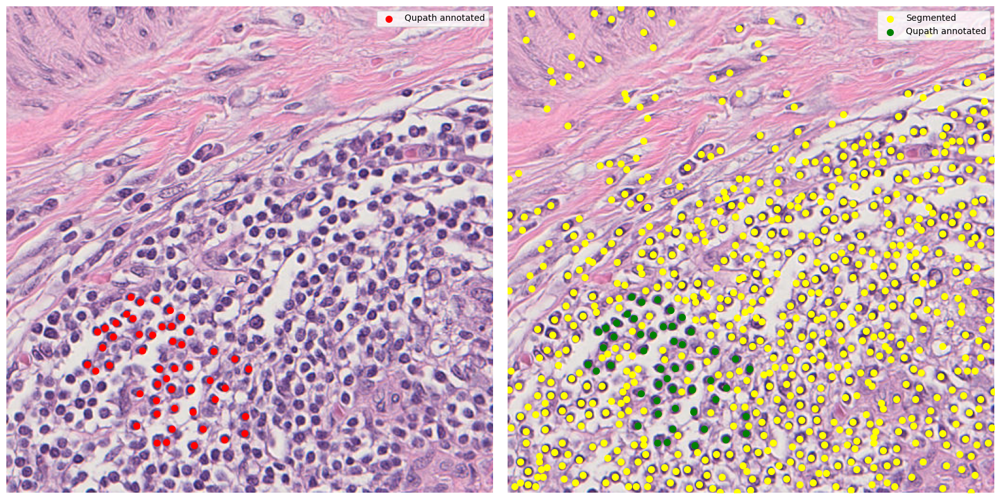

In [371]:
adj_centroids = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroids_annotated]
centroids_in_tile_ann = [pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]


adj_centroids2 = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in centroids2]
centroids_in_tile_seg = [pair for pair in adj_centroids2 if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2] and pair not in adj_centroids_matched]

show_tile_4(HE_20x_tile, centroids1=centroids_in_tile_ann, centroids2=centroids_in_tile_seg)

In [375]:
[pair for pair in adj_centroids2 if pair in adj_centroids_matched]

[[329, 131],
 [455, 229],
 [379, 175],
 [403, 193],
 [379, 191],
 [397, 157],
 [423, 175],
 [319, 169],
 [347, 109],
 [413, 217],
 [355, 183],
 [337, 163],
 [341, 93],
 [381, 159],
 [341, 191],
 [337, 103],
 [311, 139],
 [333, 115],
 [413, 155],
 [383, 91],
 [305, 129],
 [391, 167],
 [459, 167],
 [361, 141],
 [309, 157],
 [401, 173],
 [327, 181],
 [431, 249],
 [357, 101],
 [441, 135],
 [353, 173],
 [381, 253],
 [337, 173],
 [427, 157],
 [443, 207],
 [405, 137],
 [345, 139],
 [377, 83],
 [361, 217],
 [425, 195],
 [461, 195],
 [343, 151],
 [449, 249],
 [377, 107],
 [393, 211],
 [401, 227],
 [445, 171],
 [369, 237],
 [323, 123],
 [457, 157]]

In [377]:
len(adj_centroids2)

355861

In [378]:
indices_matched = [adj_centroids2.index(pair) for pair in adj_centroids2 if pair in adj_centroids_matched]
indices_matched

[342792,
 342841,
 342844,
 342930,
 342932,
 342962,
 342998,
 343081,
 343124,
 343236,
 343342,
 343432,
 343555,
 343610,
 343646,
 343837,
 343874,
 343926,
 343937,
 344052,
 344192,
 344232,
 344430,
 344657,
 344662,
 344720,
 344760,
 344798,
 344895,
 344980,
 344981,
 345007,
 345024,
 345224,
 345241,
 345428,
 345551,
 345808,
 345829,
 345913,
 346027,
 346074,
 346165,
 346758,
 347462,
 348158,
 348380,
 348607,
 349540,
 351379]

In [472]:
indices_not_matched = [adj_centroids2.index(pair) for pair in adj_centroids2 if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2] and pair not in adj_centroids_matched]  # and within crop range

print(len(indices_not_matched))

711


In [389]:
contours_matched = [contours[i] for i in indices_matched]
print(contours_matched)

[[[[34471.0390625, 34470.17687988281, 34468.98937988281, 34468.33728027344, 34467.47106933594, 34467.25085449219, 34466.924072265625, 34466.92224121094, 34467.26354980469, 34467.77978515625, 34468.021240234375, 34468.79748535156, 34469.24768066406, 34470.27307128906, 34471.072509765625, 34472.0, 34472.94445800781, 34473.748046875, 34474.74560546875, 34475.23742675781, 34476.198974609375, 34475.98742675781, 34476.39318847656, 34476.549072265625, 34476.38171386719, 34475.88513183594, 34476.13232421875, 34475.2998046875, 34474.71765136719, 34473.718505859375, 34472.91455078125, 34472.0], [34184.831298828125, 34184.401611328125, 34184.505615234375, 34183.66259765625, 34183.026123046875, 34181.96728515625, 34181.009765625, 34180.0, 34179.057861328125, 34178.251953125, 34177.341552734375, 34176.79736328125, 34175.880859375, 34175.830810546875, 34175.3369140625, 34175.029541015625, 34175.251708984375, 34175.780029296875, 34175.890869140625, 34176.7626953125, 34177.1943359375, 34178.3483886718

In [406]:
len(contours_matched[0][0])

2

In [408]:
contours_matched[0]

[[[34471.0390625,
   34470.17687988281,
   34468.98937988281,
   34468.33728027344,
   34467.47106933594,
   34467.25085449219,
   34466.924072265625,
   34466.92224121094,
   34467.26354980469,
   34467.77978515625,
   34468.021240234375,
   34468.79748535156,
   34469.24768066406,
   34470.27307128906,
   34471.072509765625,
   34472.0,
   34472.94445800781,
   34473.748046875,
   34474.74560546875,
   34475.23742675781,
   34476.198974609375,
   34475.98742675781,
   34476.39318847656,
   34476.549072265625,
   34476.38171386719,
   34475.88513183594,
   34476.13232421875,
   34475.2998046875,
   34474.71765136719,
   34473.718505859375,
   34472.91455078125,
   34472.0],
  [34184.831298828125,
   34184.401611328125,
   34184.505615234375,
   34183.66259765625,
   34183.026123046875,
   34181.96728515625,
   34181.009765625,
   34180.0,
   34179.057861328125,
   34178.251953125,
   34177.341552734375,
   34176.79736328125,
   34175.880859375,
   34175.830810546875,
   34175.33691406

In [426]:
contours_matched_adjusted = []
for i in range(len(contours_matched)):
    contour = contours_matched[i][0]
    x_coords = contour[0]
    y_coords = contour[1]
    #print(x_coords)
    #print(y_coords)
    x_coords = [point-crop_data[1] for point in x_coords]
    y_coords = [point-crop_data[0] for point in y_coords]
    
    shape = list(zip(x_coords, y_coords))
    contours_matched_adjusted.append(shape)

In [419]:
list1 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
list2 = [33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]

# Create a new list containing pairs of points
combined_list = list(zip(list1, list2))

# Print the result
print(combined_list)

[(1, 33), (2, 34), (3, 35), (4, 36), (5, 37), (6, 38), (7, 39), (8, 40), (9, 41), (10, 42), (11, 43), (12, 44), (13, 45), (14, 46), (15, 47), (16, 48), (17, 49), (18, 50), (19, 51), (20, 52), (21, 53), (22, 54), (23, 55), (24, 56), (25, 57), (26, 58), (27, 59), (28, 60), (29, 61), (30, 62), (31, 63), (32, 64)]


In [420]:
adj_contours = [[pair[0] - crop_data[1], pair[1] - crop_data[0]] for pair in contours_matched]
print(adj_contours)

TypeError: unsupported operand type(s) for -: 'list' and 'int'

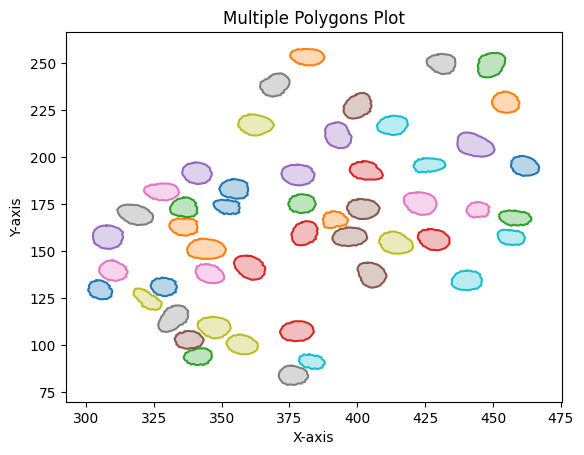

In [429]:
# Plot each polygon
for polygon in contours_matched_adjusted:
    x_coords, y_coords = zip(*polygon)
    x_coords = list(x_coords) + [x_coords[0]]  # Close the polygon
    y_coords = list(y_coords) + [y_coords[0]]  # Close the polygon

    plt.plot(x_coords, y_coords)
    plt.fill(x_coords, y_coords, alpha=0.3)  # Fill the polygon

# Set labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Multiple Polygons Plot')

# Show the plot
plt.show()

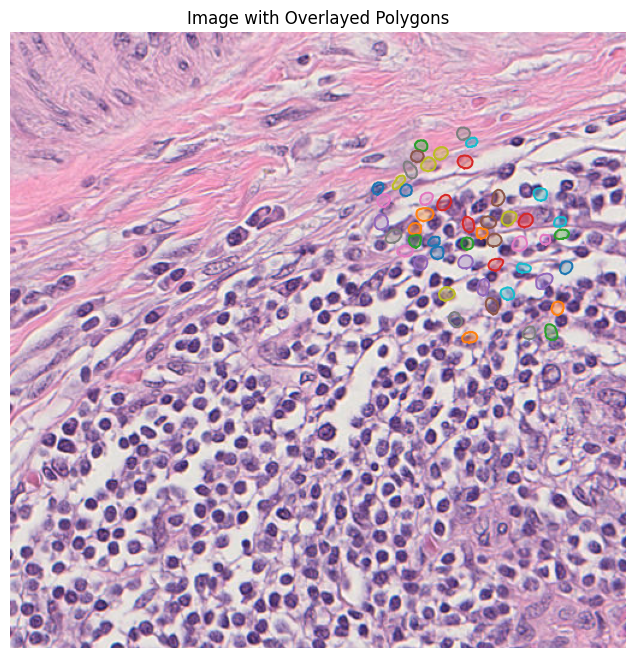

In [449]:
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the image
ax.imshow(HE_20x_tile)
ax.set_axis_off()

contours_matched_adjusted2 = [point[::-1] for point in contours_matched_adjusted]

# Plot each polygon on the same image
for polygon in contours_matched_adjusted2:
    x_coords, y_coords = zip(*polygon)
    x_coords = list(x_coords) + [x_coords[0]]  # Close the polygon
    y_coords = list(y_coords) + [y_coords[0]]  # Close the polygon

    ax.plot(x_coords, y_coords)
    ax.fill(x_coords, y_coords, alpha=0.3)  # Fill the polygon

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Image with Overlayed Polygons')

plt.show()


In [453]:
switched_contour_axis = []
for i in range(len(contours_matched_adjusted)):
    poly = [point[::-1] for point in contours_matched_adjusted[0]]
    switched_contour_axis.append(poly)

In [455]:
len(switched_contour_axis)

50

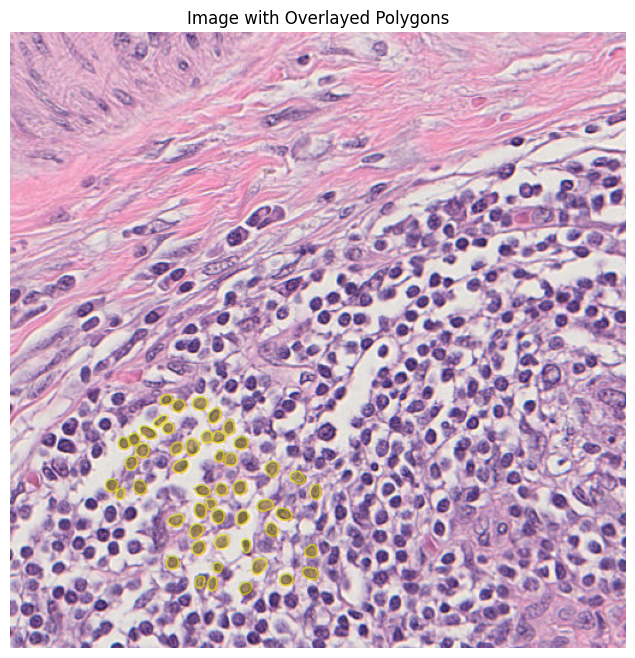

In [469]:
reversed_contours = [[(y, x) for x, y in polygon] for polygon in contours_matched_adjusted]

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the image
ax.imshow(HE_20x_tile)
ax.set_axis_off()

# Plot each reversed polygon on the same image
for polygon in reversed_contours:
    x_coords, y_coords = zip(*polygon)
    x_coords = list(x_coords) + [x_coords[0]]  # Close the polygon
    y_coords = list(y_coords) + [y_coords[0]]  # Close the polygon

    color = 'yellow'

    ax.plot(x_coords, y_coords, alpha=0.3, color=color)
    ax.fill(x_coords, y_coords, alpha=0.3, color=color)  # Fill the polygon

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Image with Overlayed Polygons')

plt.show()

In [473]:
contours_not_matched = [contours[i] for i in indices_not_matched]
# print(contours_not_matched)

contours_not_matched_adjusted = []
for i in range(len(contours_not_matched)):
    contour = contours_not_matched[i][0]
    x_coords = contour[0]
    y_coords = contour[1]
    #print(x_coords)
    #print(y_coords)
    x_coords = [point-crop_data[1] for point in x_coords]
    y_coords = [point-crop_data[0] for point in y_coords]
    
    shape = list(zip(x_coords, y_coords))
    contours_not_matched_adjusted.append(shape)

In [474]:
len(contours_not_matched_adjusted)

711

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


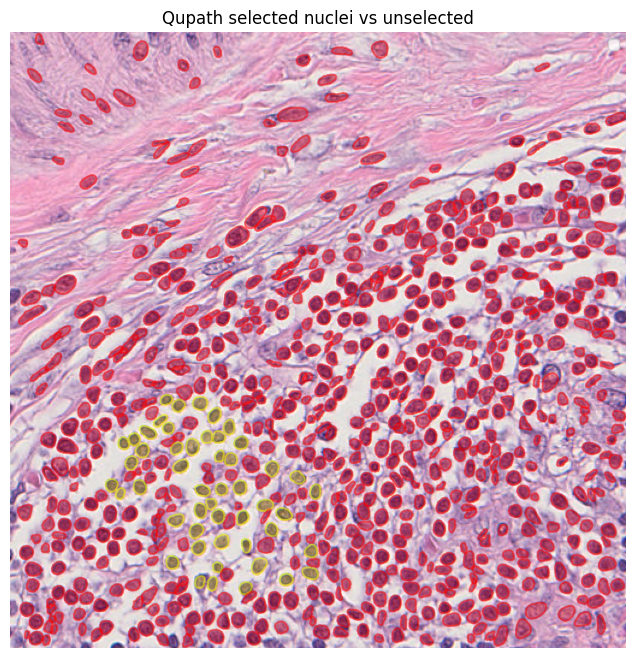

In [495]:
reversed_contours = [[(y, x) for x, y in polygon] for polygon in contours_matched_adjusted]

reversed_contours_negative = [[(y, x) for x, y in polygon] for polygon in contours_not_matched_adjusted]

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the image
ax.imshow(HE_20x_tile)
ax.set_axis_off()

# Plot each reversed polygon on the same image
for polygon in reversed_contours:
    x_coords, y_coords = zip(*polygon)
    x_coords = list(x_coords) + [x_coords[0]]  # Close the polygon
    y_coords = list(y_coords) + [y_coords[0]]  # Close the polygon

    color = 'yellow'

    ax.plot(x_coords, y_coords, alpha=0.3, color=color, label='Selected')
    ax.fill(x_coords, y_coords, alpha=0.3, color=color)  # Fill the polygon
    
# Plot each reversed polygon on the same image
for polygon in reversed_contours_negative:
    x_coords, y_coords = zip(*polygon)
    x_coords = list(x_coords) + [x_coords[0]]  # Close the polygon
    y_coords = list(y_coords) + [y_coords[0]]  # Close the polygon

    color = 'red'
    
    skip = False
    for x in x_coords:
        if x < 0 or x > 511:
            skip = True
            break
    for y in y_coords:
        if y < 0 or y > 511:
            skip = True
            break
    
    if not skip:

        ax.plot(x_coords, y_coords, alpha=0.3, color=color, label='Selected')
        ax.fill(x_coords, y_coords, alpha=0.3, color=color)  # Fill the polygon

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Qupath selected nuclei vs unselected')

ax.legend()

plt.show()

In [363]:
len(centroids_in_tile_seg)

761

In [339]:
[pair for pair in adj_centroids if 0 < pair[1] < crop_data[3] and 0 < pair[0] < crop_data[2]]

[[403.0, 193.7368421052597],
 [402.33333333333576, 173.1999999999971],
 [397.1052631578932, 158.7368421052597],
 [381.2380952380918, 160.66666666666424],
 [380.61538461538294, 176.23076923076587],
 [391.36363636363967, 167.59090909091174],
 [361.6315789473665, 142.5789473684199],
 [400.9333333333343, 229.66666666666424],
 [393.2631578947403, 213.4736842105267],
 [413.34999999999854, 218.59999999999854],
 [426.1052631578932, 195.5789473684199],
 [422.7060975609784, 176.27780487804557],
 [414.2142857142826, 157.07142857142753],
 [406.8107317073154, 139.97585365853593],
 [428.1999999999971, 158.0],
 [441.3181818181838, 136.59090909091174],
 [444.2105263157864, 173.4736842105267],
 [458.4736842105267, 167.6315789473665],
 [458.9333333333343, 157.46666666666715],
 [461.66666666666424, 196.66666666666424],
 [444.3181818181838, 206.59090909091174],
 [455.4375, 229.0625],
 [449.1999999999971, 250.26666666667006],
 [431.0, 250.777777777781],
 [381.2352941176505, 254.41176470588107],
 [370.23809